# Imports

In [1]:
import requests

import numpy as np
from matplotlib import pyplot as plt
from skimage import exposure
from PIL import Image

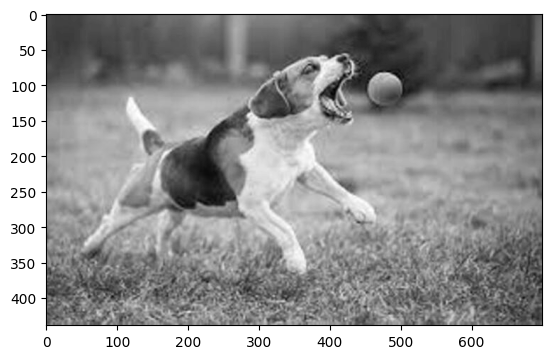

Dimensiones de la imagen:  (439, 700)


In [2]:
img = plt.imread('/content/perro_gris.jpg')
# img_cuadrada = plt.imread('/content/perro_gris_cuadrado.jpg')


img_cuadrada = Image.open('/content/perro_gris_cuadrado.jpg').convert('L')
img_cuadrada.save('perro_gris_cuadrado.jpg')
img_cuadrada = plt.imread('/content/perro_gris_cuadrado.jpg')

img_color = plt.imread('/content/perro.jpg')

plt.imshow(img, cmap='gray')
plt.show()

height_inicial, width_inicial = np.shape(img)

print("Dimensiones de la imagen: ", np.shape(img))

# 1.- Equalización de histogramas

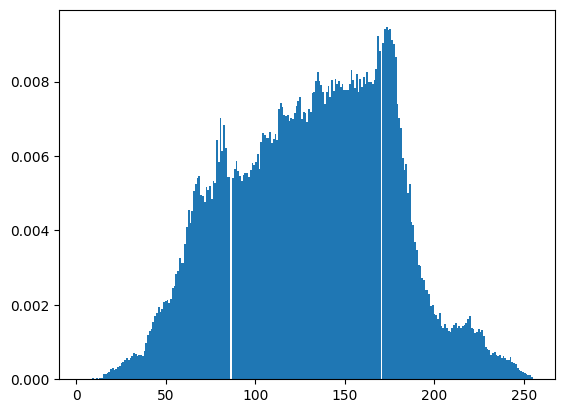

In [3]:
# Histograma de frecuencias relativas
flat_array = img.flatten()
plt.hist(flat_array, bins=255, density = True)
plt.show()

In [4]:
# Array con las frecuencias absolutas
absolute_freq = np.histogram(flat_array, bins=255)[0]

In [5]:
# Array con las frecuencias relativas
relative_freq = absolute_freq/(height_inicial*width_inicial)

In [6]:
# Array con la suma acumulada de las frecuencias relativas -> para generar histograma cumulativo
cumulative_histogram = np.cumsum(relative_freq)

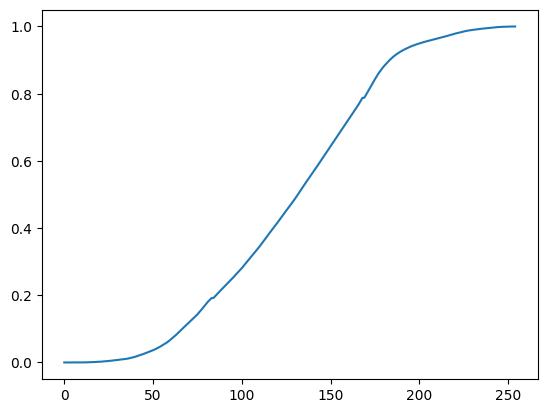

In [7]:
# Gráfico del histograma cumulativo
plt.plot([i for i in range(255)], cumulative_histogram)

In [8]:
# Equalizar histograma
hist_equalizado = [round(cumulative_histogram[i] * 255) for i in range(255)]

In [9]:
# Remapear
img2 = img.copy()

for i in range(width_inicial):
  for j in range(height_inicial):
    g_p = img2[j,i]
    if g_p == 255:
      img2[j,i] = 255
      continue
    img2[j,i] = hist_equalizado[g_p]

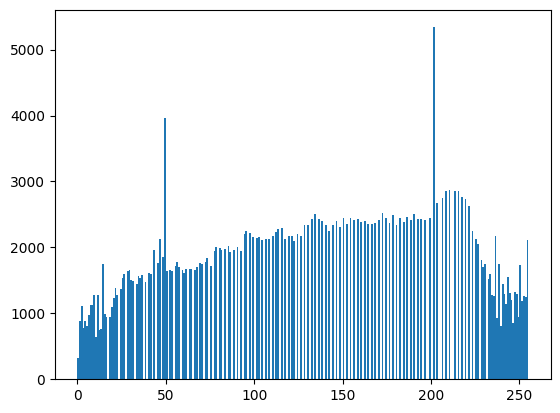

In [10]:
# Vemos el histograma de la imagen equalizada
flat_array2 = img2.flatten()
plt.hist(flat_array2, bins=255)
plt.show()

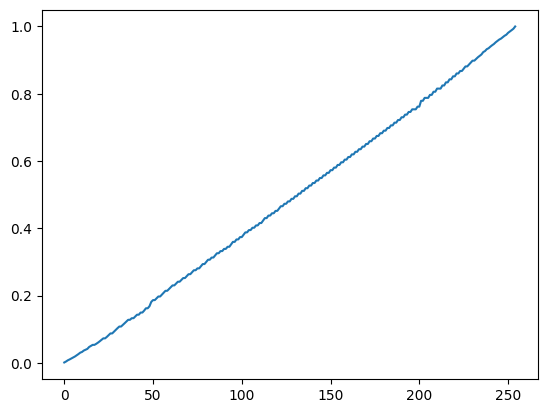

In [11]:
# Comprobamos que el histograma es mucho más uniforme con el histograma cumulativo
absolute_freq2 = np.histogram(flat_array2, bins=255)[0]

relative_freq2 = absolute_freq2/(height_inicial*width_inicial)

cumulative_histogram2 = np.cumsum(relative_freq2)

plt.plot([i for i in range(255)], cumulative_histogram2)

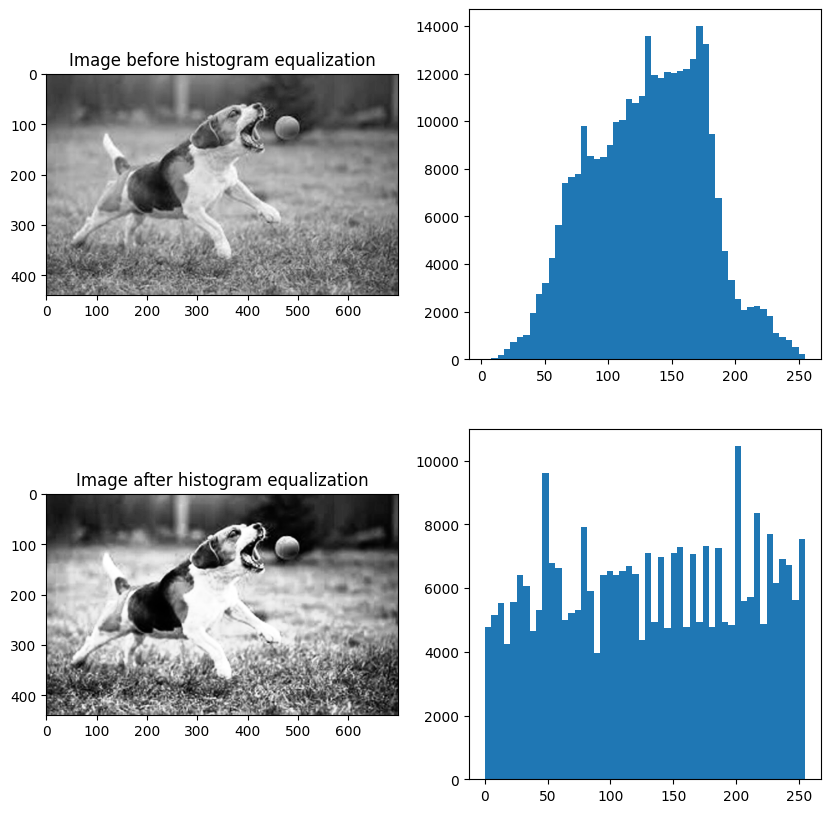

In [12]:
fig, ax = plt.subplots(2, 2, figsize=(10,10))
ax[0][0].set_title('Image before histogram equalization')
ax[0][0].imshow(img, cmap='gray')
ax[0][1].hist(flat_array, bins=50)

ax[1][0].set_title('Image after histogram equalization')
ax[1][0].imshow(img2, cmap='gray')
ax[1][1].hist(flat_array2, bins=50)

plt.show()

# Funciones para auxiliares para hacer CLAHE

In [13]:
def subdivide(img, dimx, dimy, width_inicial, height_inicial):
  width_subm = int(width_inicial/dimx)
  height_subm = int(height_inicial/dimy)

  division = []

  for i in range(dimx):

    num_pix_x_inicio = i * width_subm

    if i == dimx-1:
      num_pix_x_fin = width_inicial
    else:
      num_pix_x_fin = num_pix_x_inicio + width_subm

    for j in range(dimy):

      num_pix_y_inicio = j*height_subm

      if j == dimy-1:
        num_pix_y_fin = height_inicial
      else:
        num_pix_y_fin = num_pix_y_inicio + height_subm

      subim = img[num_pix_y_inicio:num_pix_y_fin, num_pix_x_inicio:num_pix_x_fin]
      division.append(subim)

  return division


In [14]:
def unir(imgs, dimx, dimy, width_inicial, height_inicial):
  # Dimensions of individual arrays
  big_array = np.zeros((height_inicial, width_inicial))

  width_subm = int(width_inicial/dimx)
  height_subm = int(height_inicial/dimy)

  contador = 0

  for i in range(dimx):

    num_pix_x_inicio = i * width_subm

    if i == dimx-1:
      num_pix_x_fin = width_inicial
    else:
      num_pix_x_fin = num_pix_x_inicio + width_subm

    for j in range(dimy):

      num_pix_y_inicio = j*height_subm

      if j == dimy-1:
        num_pix_y_fin = height_inicial
      else:
        num_pix_y_fin = num_pix_y_inicio + height_subm

      big_array[num_pix_y_inicio:num_pix_y_fin, num_pix_x_inicio:num_pix_x_fin] = imgs[contador]

      contador += 1

  return big_array

In [15]:
def proceso_y_equalizar_clip_limit(img, limite):
  height, width = np.shape(img)

  flat_array = img.flatten()

  # Array con las frecuencias absolutas
  absolute_freq = np.histogram(flat_array, bins=255)[0]

# Siguiendo instrucciones de: https://stackoverflow.com/questions/64576472/what-does-clip-limit-mean-exactly-in-opencv-clahe
  if (limite > 0):
    clipped = 0
    for i in range(len(absolute_freq)):
      if absolute_freq[i] > limite:
        clipped += absolute_freq[i]-limite
        absolute_freq[i] = limite

  # // redistribute clipped pixels
    redistBatch = clipped / len(absolute_freq)
    for i in range(len(absolute_freq)):
        absolute_freq[i] += redistBatch

  # Array con las frecuencias relativas
  relative_freq = absolute_freq/(height*width)

  # Array con la suma acumulada de las frecuencias relativas -> para generar histograma cumulativo
  cumulative_histogram = np.cumsum(relative_freq)

  # Equalizar histograma
  hist_equalizado = [round(cumulative_histogram[i] * 255) for i in range(255)]

  # Remapear
  img2 = img.copy()
  tono_nuevo = 0
  for i in range(width):
    for j in range(height):
      g_p = img2[j,i]

      if g_p == 255:
        img2[j,i] = 255
        continue

      # if abs(hist_equalizado[g_p] - g_p) >= limite:
      #   tono_nuevo = g_p
      # else:
      tono_nuevo = hist_equalizado[g_p]

      img2[j,i] = tono_nuevo

  return img2

# Aplicando el CLAHE imagen BN rectangular

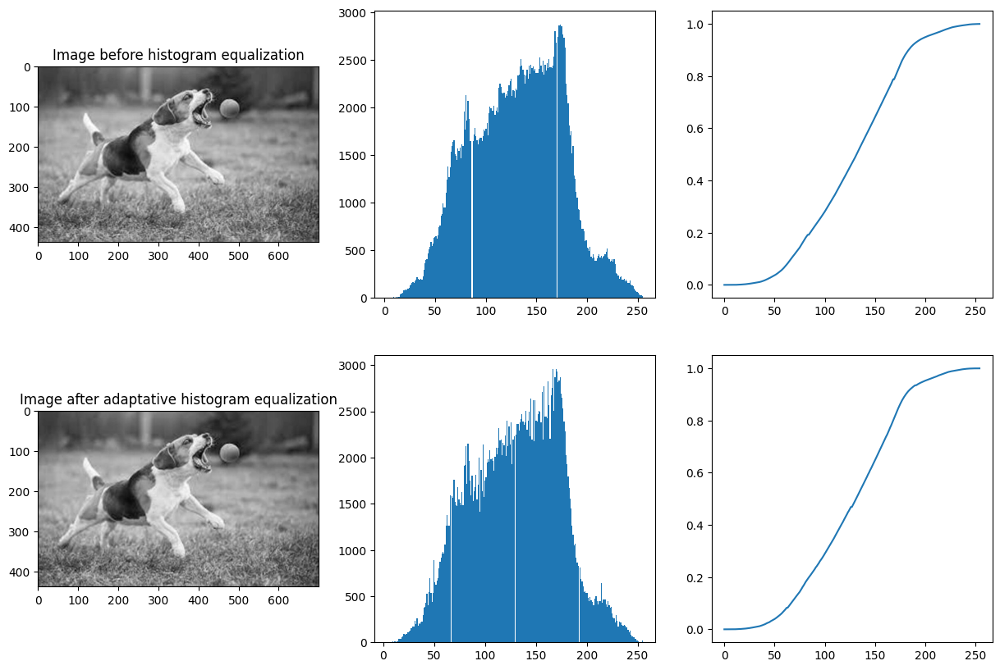

In [16]:
equalizadas = []
subimages = subdivide(img, 6,6, width_inicial, height_inicial)

for i in subimages:
  equalizadas.append(proceso_y_equalizar_clip_limit(i, 4))

ahe_unida = unir(equalizadas, 6, 6, width_inicial, height_inicial)


# Vemos el histograma de la imagen equalizada
flat_array_ahe = ahe_unida.flatten()

# Comprobamos que el histograma es mucho más uniforme con el histograma cumulativo
absolute_freq_ahe = np.histogram(flat_array_ahe, bins=255)[0]
relative_freq_ahe = absolute_freq_ahe/(height_inicial*width_inicial)
cumulative_histogram_ahe = np.cumsum(relative_freq_ahe)

fig, ax = plt.subplots(2, 3, figsize=(15,10))
ax[0][0].set_title('Image before histogram equalization')
ax[0][0].imshow(img, cmap='gray')
ax[0][1].hist(flat_array, bins=255)
ax[0][2].plot([i for i in range(255)], cumulative_histogram)

ax[1][0].set_title('Image after adaptative histogram equalization')
ax[1][0].imshow(ahe_unida, cmap='gray')
ax[1][1].hist(flat_array_ahe, bins=255)
ax[1][2].plot([i for i in range(255)], cumulative_histogram_ahe)

plt.show()

# Imagen cuadrada CLAHE

In [17]:
np.shape(img_cuadrada)

(438, 438)

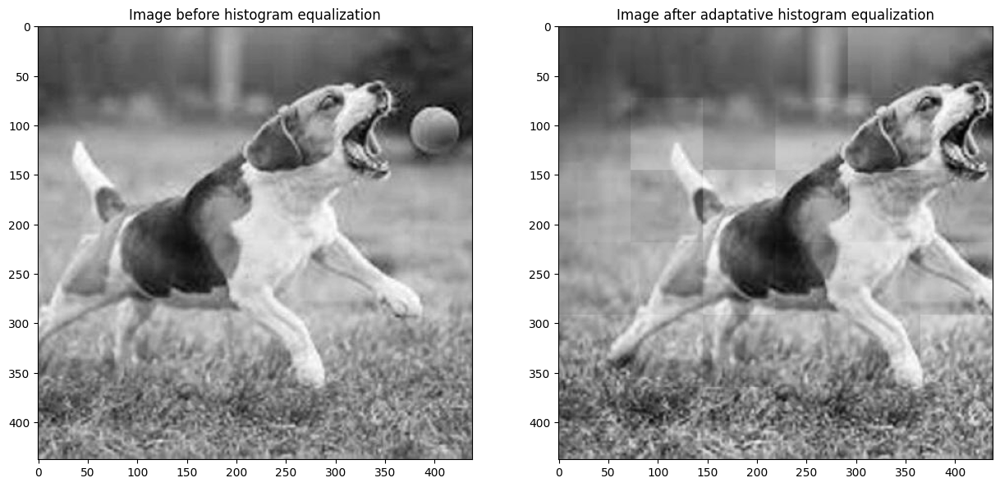

In [18]:
height_inicial_cuadrada, width_inicial_cuadrada = np.shape(img_cuadrada)


equalizadas_cuadrada = []

subimages_cuadrada = subdivide(img, 6,6, width_inicial_cuadrada, height_inicial_cuadrada)

for i in subimages_cuadrada:
  equalizadas_cuadrada.append(proceso_y_equalizar_clip_limit(i, 20))

ahe_unida_cuadrada = unir(equalizadas_cuadrada, 6, 6, width_inicial_cuadrada, height_inicial_cuadrada)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].set_title('Image before histogram equalization')
ax[0].imshow(img_cuadrada, cmap='gray')

ax[1].set_title('Image after adaptative histogram equalization')
ax[1].imshow(ahe_unida_cuadrada, cmap='gray')

plt.show()

# CLAHE imagen con color

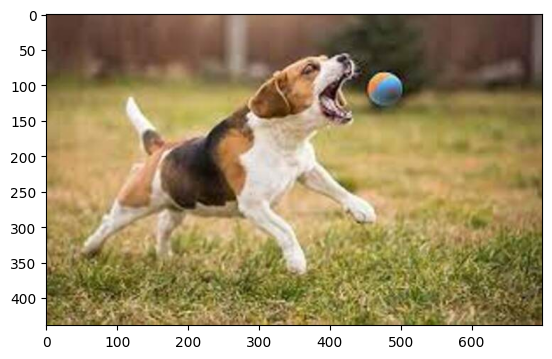

In [19]:
# img_color = plt.imread('/content/perro.jpg')
plt.imshow(img_color)
plt.show()

height_inicial_color, width_inicial_color, num_colores = np.shape(img_color)


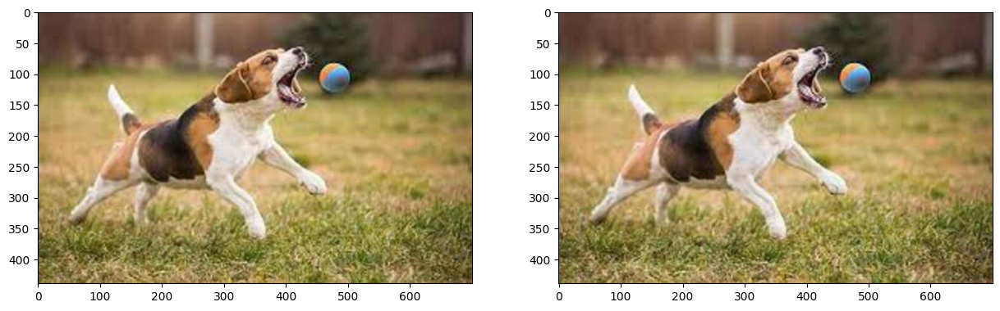

In [20]:
equalizacion_total_colores = np.zeros(np.shape(img_color))
for k in range(num_colores):
  imagen_tono = img_color[:,:,k]

  subimages = subdivide(imagen_tono, 6,6, width_inicial_color, height_inicial_color)

  equalizadas = []
  for i in subimages:
    equalizadas.append(proceso_y_equalizar_clip_limit(i, 10))

  ahe_unida = unir(equalizadas, 6, 6, width_inicial_color, height_inicial_color)

  equalizacion_total_colores[:,:,k] = ahe_unida

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_color)
ax[1].imshow(equalizacion_total_colores.astype('uint8'))

plt.show()

# Funciones auxiliares para crear Kernel y aplicar una convolución

In [21]:
def create_ker(func, kernel_size, sigma, factor, ker = None):
  try:
    if ker == None:
      ker=np.zeros((kernel_size,kernel_size))
  except:
    # Nos dará error cuando esté creada porque nos pedirá hacer algo del estilo de ker.all() == None
    pass
  for i in range(kernel_size):
    for j in range(kernel_size):
      ker[i,j] += func(i,j,kernel_size,sigma, factor)

  return ker

def apply_conv(image, kernel, padding=0, stride=1):
  # Get dimensions of the image and kernel
  image_height, image_width = image.shape
  kernel_height, kernel_width = kernel.shape

  # Calculate the output dimensions after padding and stride
  output_height = ((image_height + 2 * padding - kernel_height) // stride) + 1
  output_width = ((image_width + 2 * padding - kernel_width) // stride) + 1

  # Initialize the output matrix with zeros
  output = np.zeros((output_height, output_width))

  # Pad the input image
  padded_image = np.pad(image, padding, mode='constant')

  # Perform convolution
  for i in range(0, output_height):
    for j in range(0, output_width):
      # Apply the convolution operation for each position
      output[i, j] = np.sum(padded_image[i*stride:i*stride+kernel_height, j*stride:j*stride+kernel_width] * kernel)

  return output

# Filtro de paso bajo Gaussiano

# Rectangular

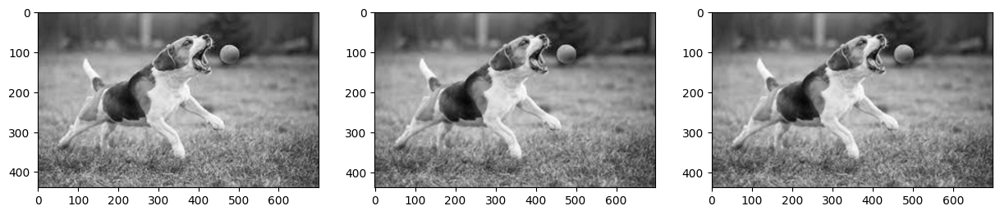

In [22]:
#Tenemos img (gray) y img_color (color)
def Gaussian(x,y,kernel_size,sigma, factor):
    return (1/(2*np.pi*sigma**2)) * np.exp(-((x - kernel_size//2)**2+(y - kernel_size//2)**2)/(2*sigma**2)) * factor


kernel_size = 3
sigma = 1

ker = create_ker(Gaussian, kernel_size, sigma, 1)

ker_mejorado = ker.copy()
ker_mejorado = create_ker(Gaussian, kernel_size, sigma, 1-np.sum(ker_mejorado), ker_mejorado)

fig, ax = plt.subplots(1, 3, figsize=(15,10))
ax[0].imshow(img, cmap="gray")

convolucion_paso_bajo = apply_conv(img, ker, padding=0, stride=1)
ax[1].imshow(convolucion_paso_bajo, cmap="gray")

convolucion_paso_bajo_mejorado = apply_conv(img, ker_mejorado, padding=0, stride=1)
ax[2].imshow(convolucion_paso_bajo_mejorado, cmap="gray")

plt.show()

# Cuadrada

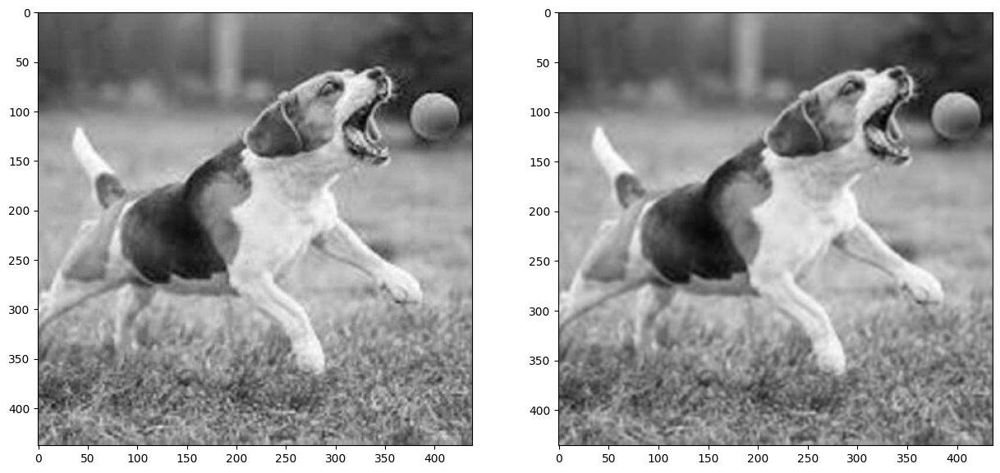

In [23]:
kernel_size = 3
sigma = 1

ker = create_ker(Gaussian, kernel_size, sigma, 1)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_cuadrada, cmap="gray")

convolucion_paso_bajo_cuadrada = apply_conv(img_cuadrada, ker, padding=0, stride=1)
ax[1].imshow(convolucion_paso_bajo_cuadrada, cmap="gray")

plt.show()

# Color

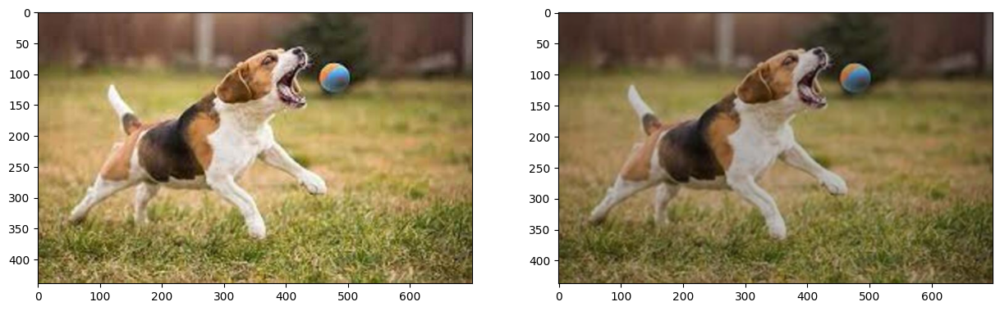

In [24]:
kernel_size = 3
num_colores = 3
sigma = 1
ker_gauss = create_ker(Gaussian, kernel_size, sigma, 1)

padding = 0
stride = 1

output_height = ((np.shape(img_color)[0] + 2 * padding - np.shape(ker_gauss)[0]) // stride) + 1
output_width = ((np.shape(img_color)[1] + 2 * padding - np.shape(ker_gauss)[1]) // stride) + 1

filtro_paso_bajo_colores = np.zeros((output_height, output_width, np.shape(img_color)[2]))

for k in range(num_colores):
  imagen_tono = img_color[:,:,k]
  convolucion_paso_bajo = apply_conv(imagen_tono, ker_gauss, padding=padding, stride=stride)
  filtro_paso_bajo_colores[:,:,k] = convolucion_paso_bajo

filtro_paso_bajo_colores = np.around(filtro_paso_bajo_colores).astype('uint8')

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_color)
ax[1].imshow(filtro_paso_bajo_colores)

plt.show()

# Filtro de paso alto Laplaciano

# Rectangular

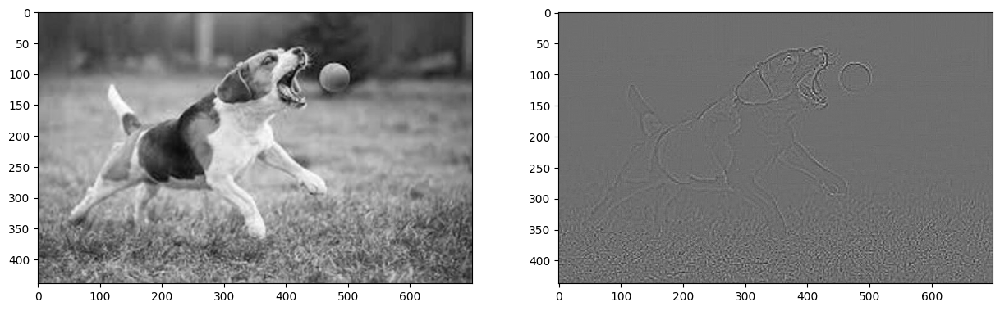

In [25]:
def Laplacian_of_Gaussian(x,y,kenel_size, sigma, factor):
  # return -(1/(np.pi*sigma**4)) * (1-(((x - kernel_size//2)**2+(y - kernel_size//2)**2)/(2*sigma**2))) * np.exp(-((x - kernel_size//2)**2+(y - kernel_size//2)**2)/(2*sigma**2)) * factor
  ker = [[0,1,0],[1,-4,1],[0,1,0]]
  return ker[x][y]

kernel_size = 3
sigma = 1

ker_laplaciano = create_ker(Laplacian_of_Gaussian, kernel_size, sigma, 1)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img, cmap="gray")

convolucion_paso_alto = apply_conv(img, ker_laplaciano, padding=0, stride=1)
ax[1].imshow(convolucion_paso_alto, cmap="gray")

plt.show()

# Cuadrada

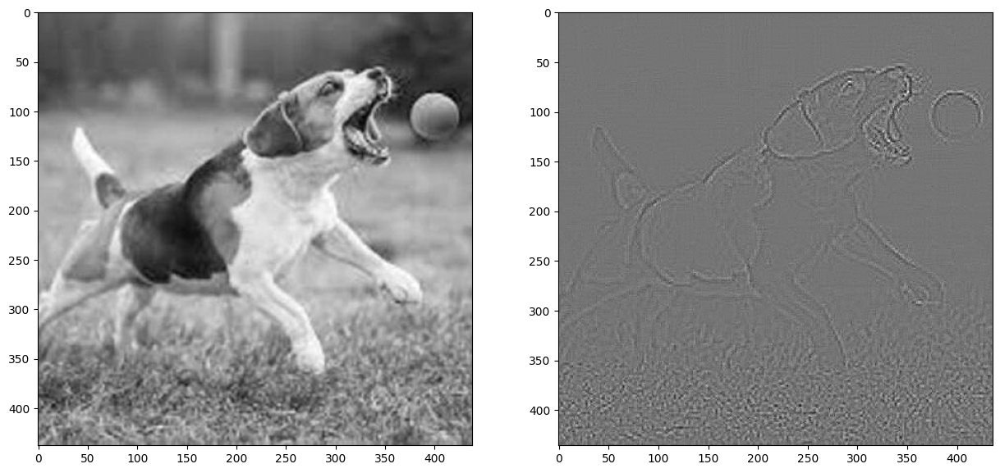

In [26]:
kernel_size = 3
sigma = 1

ker_laplaciano = create_ker(Laplacian_of_Gaussian, kernel_size, sigma, 1)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_cuadrada, cmap="gray")

convolucion_paso_alto_cuadrada = apply_conv(img_cuadrada, ker_laplaciano, padding=0, stride=1)
ax[1].imshow(convolucion_paso_alto_cuadrada, cmap="gray")

plt.show()

# Color

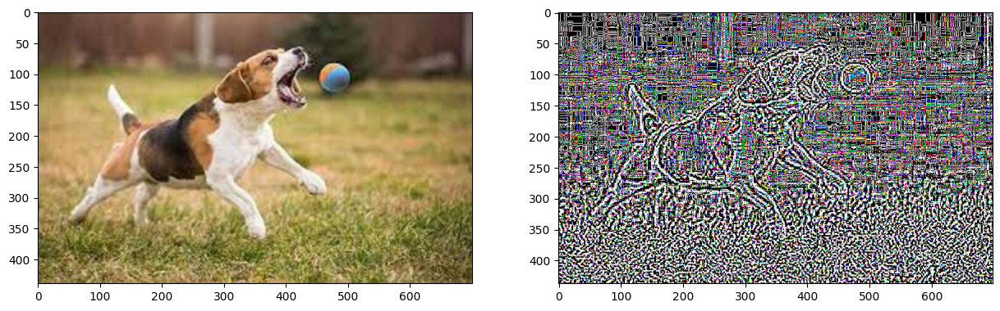

In [27]:
kernel_size = 3
sigma = 1
ker_lap = create_ker(Laplacian_of_Gaussian, kernel_size, sigma, 1)

padding = 0
stride = 1

output_height = ((np.shape(img_color)[0] + 2 * padding - np.shape(ker_lap)[0]) // stride) + 1
output_width = ((np.shape(img_color)[1] + 2 * padding - np.shape(ker_lap)[1]) // stride) + 1

filtro_paso_alto_colores = np.zeros((output_height, output_width, np.shape(img_color)[2]))

for k in range(num_colores):
  imagen_tono = img_color[:,:,k]
  convolucion_paso_bajo = apply_conv(imagen_tono, ker_lap, padding=padding, stride=stride)
  filtro_paso_alto_colores[:,:,k] = convolucion_paso_bajo

filtro_paso_alto_colores = np.around(filtro_paso_alto_colores).astype('uint8')

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_color)
ax[1].imshow(filtro_paso_alto_colores)

plt.show()

#Filtrado no lineal Kuwahara

# Funcion auxiliar

In [28]:
def filtro_kuwahara(image, window_size):

  img = np.zeros(image.shape, dtype=np.int16)
  v = int((window_size - 1) / 2)
  padded_img = np.pad(image, ((v, v), (v, v)), mode='symmetric')

  for i in range(v, padded_img.shape[0] - v):  # Recorre todos los pixeles originales de la imagen (gracias al padding)
    for j in range(v, padded_img.shape[1] - v):
      # print(f"Calculos: subregion_1 = padded_img[{j-v}:{j}, {i-v}:{i}]\nCalculos: subregion_2 = padded_img[{j-v}:{j}, {i}:{i+v+1}]\nCalculos: subregion_3 = padded_img[{j}:{j+v+1}, {i-v}:{i}]\nCalculos: subregion_4 = padded_img[{j}:{j+v+1}, {i}:{i+v+1}]\n")

      subregion_1 = padded_img[i-v : i     , j-v : j    ]
      subregion_2 = padded_img[i   : i+v+1 , j-v : j    ]
      subregion_3 = padded_img[i-v : i     , j   : j+v+1]
      subregion_4 = padded_img[i   : i+v+1 , j   : j+v+1]

      subregions = [subregion_1, subregion_2, subregion_3, subregion_4]

      mean_values = [np.mean(subregion) for subregion in subregions]
      variance_values = [np.var(subregion) for subregion in subregions]
      min_variance_idx = np.argmin(variance_values)

      # print(mean_values)

      # print(subregions)
      img[i-v,j-v] = mean_values[min_variance_idx]

  return img



# Rectangular

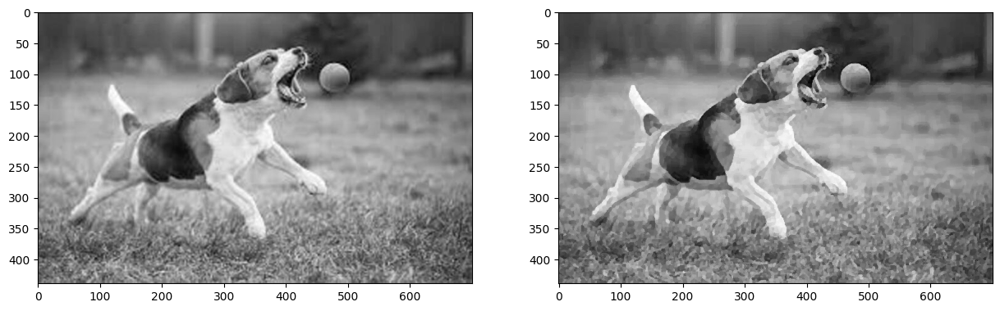

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img, cmap="gray")

img_kuwahara = filtro_kuwahara(img, 5)
ax[1].imshow(img_kuwahara, cmap="gray")

plt.show()

# Cuadrada

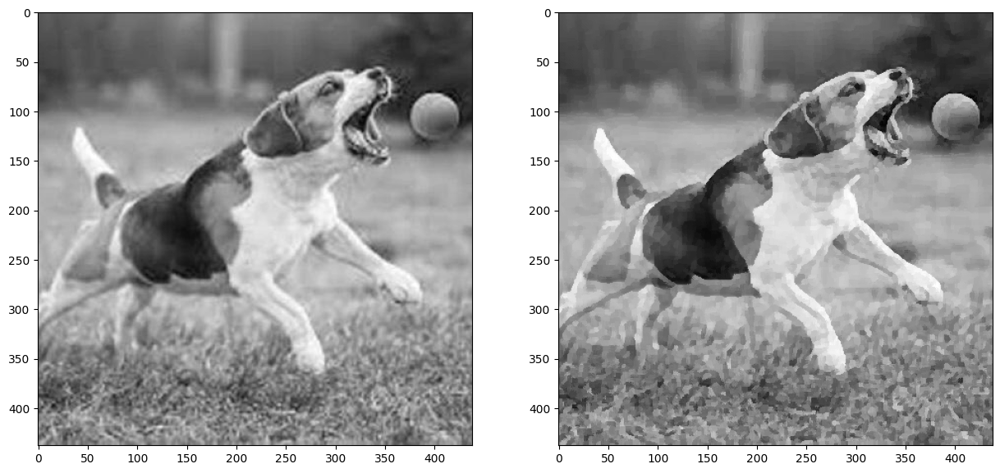

In [30]:
fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_cuadrada, cmap="gray")

img_kuwahara_cuadrada = filtro_kuwahara(img_cuadrada, 5)
ax[1].imshow(img_kuwahara_cuadrada, cmap="gray")

plt.show()

# Color

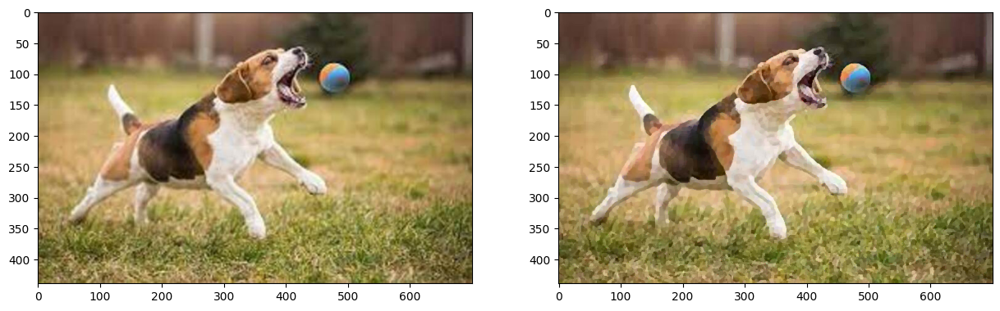

In [31]:
fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_color)

img_output = np.zeros(np.shape(img_color))

for i in range(img_output.shape[2]):
  img_output[:,:,i] = filtro_kuwahara(img_color[:,:,i], 5)

img_output = np.around(img_output).astype('uint8')

ax[1].imshow(img_output)

plt.show()

# Filtrado no lineal Canny

# Rectangular

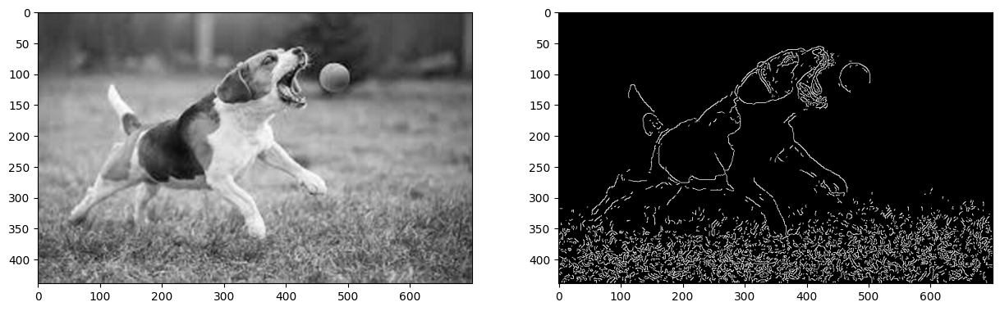

In [32]:
# Filtrado de Canny
import cv2

edges = cv2.Canny(img,130,150)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img, cmap = 'gray')
ax[1].imshow(edges, cmap = 'gray')

plt.show()


# Cuadrada

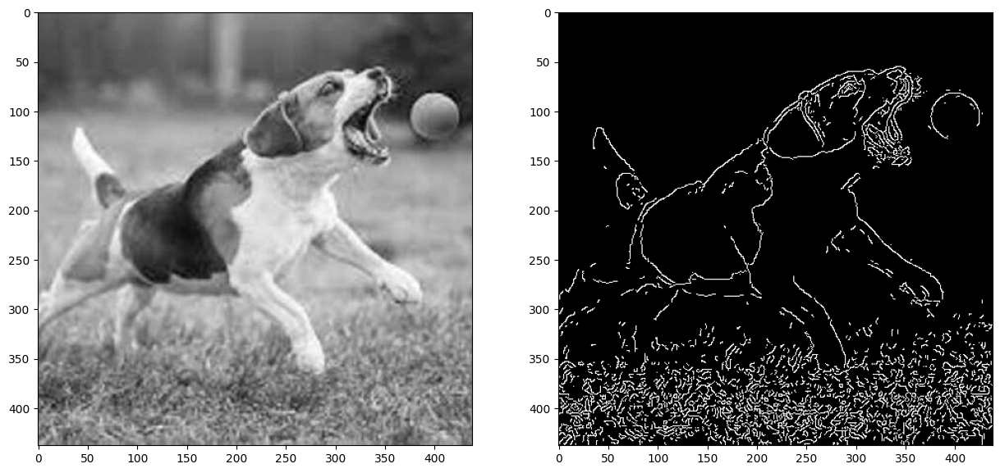

In [33]:
edges_cuadrada = cv2.Canny(img_cuadrada,130,150)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_cuadrada, cmap = 'gray')
ax[1].imshow(edges_cuadrada, cmap = 'gray')

plt.show()

# Color

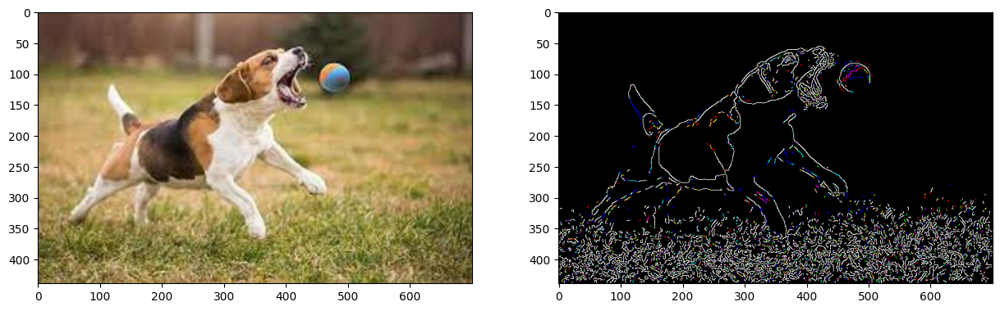

In [34]:
edges_color = np.zeros(img_color.shape)
for i in range(num_colores):
  edges_color[:,:,i] = cv2.Canny(img_color[:,:,i],130,150)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_color)
ax[1].imshow(edges_color)

plt.show()

# Descriptor FAST

# Rectangular

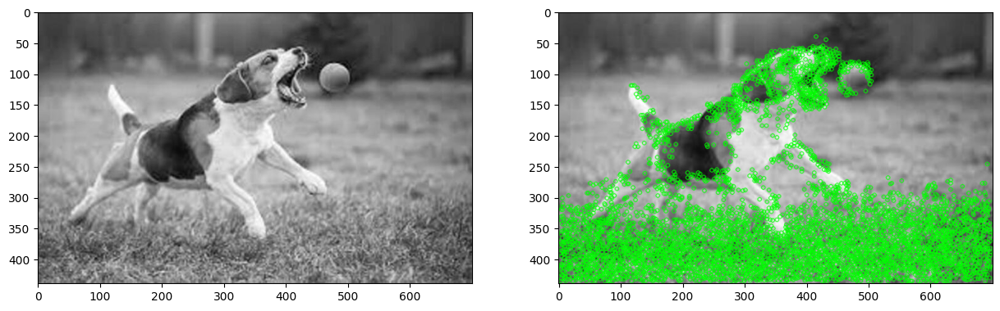

In [35]:
fast = cv2.FastFeatureDetector_create()

keypoints = fast.detect(img, None)

img_with_keypoints_fast = cv2.drawKeypoints(img, keypoints, None, color=(0, 255, 0), flags=cv2.DrawMatchesFlags_DEFAULT)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img, cmap="gray")
ax[1].imshow(img_with_keypoints_fast)

plt.show()

# Cuadrada

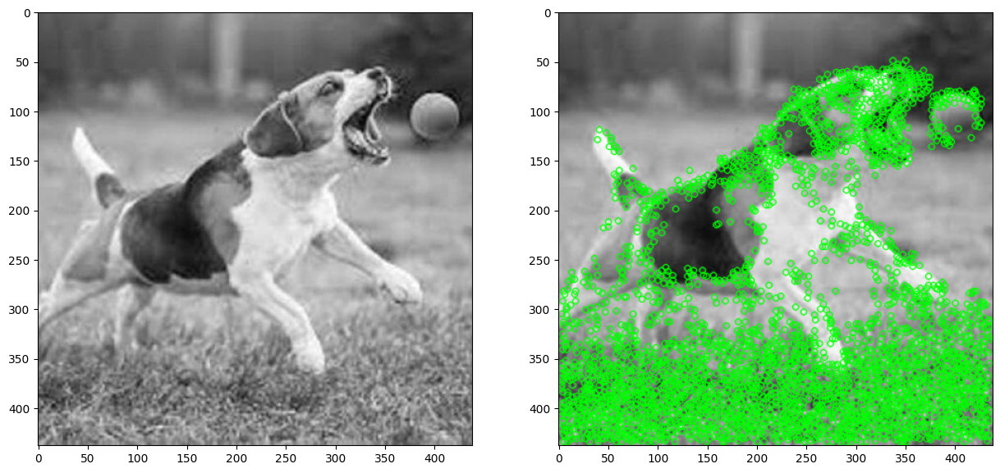

In [36]:
fast = cv2.FastFeatureDetector_create()

keypoints_cuadrada = fast.detect(img_cuadrada, None)

img_with_keypoints_fast_cuadrada = cv2.drawKeypoints(img_cuadrada, keypoints_cuadrada, None, color=(0, 255, 0), flags=cv2.DrawMatchesFlags_DEFAULT)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_cuadrada, cmap="gray")
ax[1].imshow(img_with_keypoints_fast_cuadrada)

plt.show()

# Color

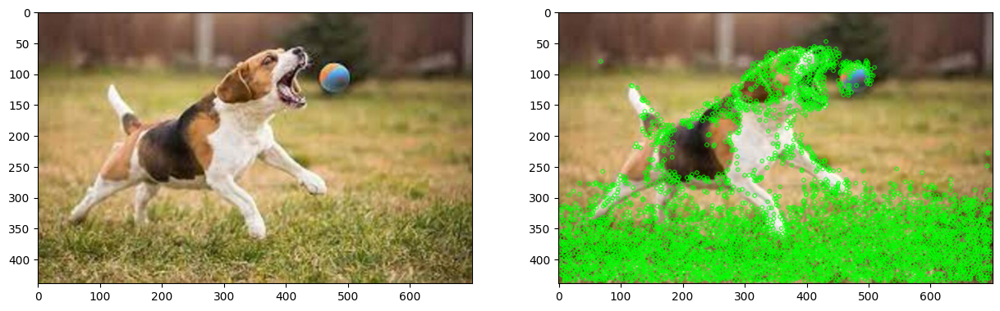

In [37]:
fast = cv2.FastFeatureDetector_create()

keypoints = fast.detect(img_color, None)

img_with_keypoints_fast_color = cv2.drawKeypoints(img_color, keypoints, None, color=(0, 255, 0), flags=cv2.DrawMatchesFlags_DEFAULT)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_color)
ax[1].imshow(img_with_keypoints_fast_color)

plt.show()

# Descriptor SIFT + BRIEF

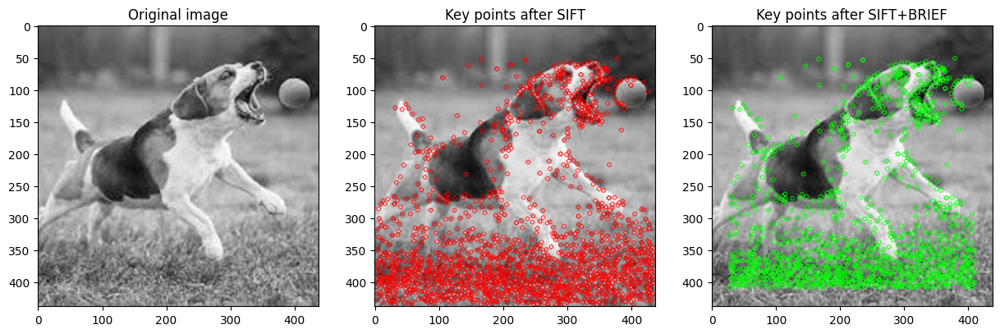

In [38]:
sift = cv2.SIFT_create()
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

keypoints_cuadrada = sift.detect(img_cuadrada, None)

keypoints_cuadrada2, descriptors = brief.compute(img_cuadrada, keypoints_cuadrada)

img_with_keypoints_sift_cuadrada = cv2.drawKeypoints(img_cuadrada, keypoints_cuadrada, None, color=(255, 0, 0), flags=cv2.DrawMatchesFlags_DEFAULT)
img_with_keypoints_sift_cuadrada2 = cv2.drawKeypoints(img_cuadrada, keypoints_cuadrada2, None, color=(0, 255, 0), flags=cv2.DrawMatchesFlags_DEFAULT)

fig, ax = plt.subplots(1, 3, figsize=(15,10))
ax[0].set_title('Original image')
ax[0].imshow(img_cuadrada, cmap="gray")
ax[1].set_title('Key points after SIFT')
ax[1].imshow(img_with_keypoints_sift_cuadrada)
ax[2].set_title('Key points after SIFT+BRIEF')
ax[2].imshow(img_with_keypoints_sift_cuadrada2)

plt.show()

# Cuadrada

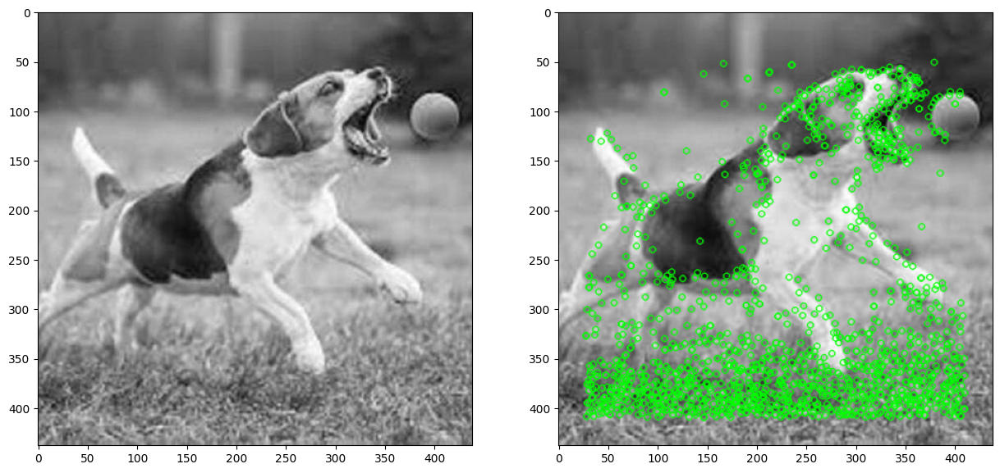

In [39]:
sift = cv2.SIFT_create()
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

keypoints_cuadrada = sift.detect(img_cuadrada, None)

keypoints_cuadrada, descriptors = brief.compute(img_cuadrada, keypoints_cuadrada)

img_with_keypoints_sift_cuadrada = cv2.drawKeypoints(img_cuadrada, keypoints_cuadrada, None, color=(0, 255, 0), flags=cv2.DrawMatchesFlags_DEFAULT)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_cuadrada, cmap="gray")
ax[1].imshow(img_with_keypoints_sift_cuadrada)

plt.show()

# Color

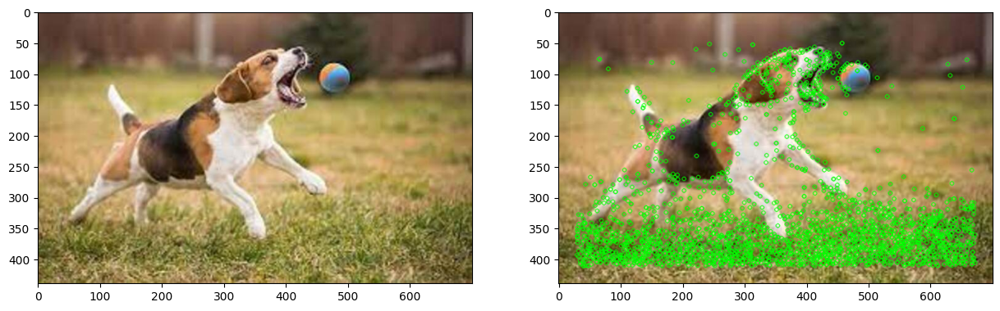

In [40]:
sift = cv2.SIFT_create()
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

keypoints = sift.detect(img_color, None)

keypoints, descriptors = brief.compute(img_color, keypoints)

img_with_keypoints_sift_color = cv2.drawKeypoints(img_color, keypoints, None, color=(0, 255, 0), flags=cv2.DrawMatchesFlags_DEFAULT)

fig, ax = plt.subplots(1, 2, figsize=(15,10))
ax[0].imshow(img_color)
ax[1].imshow(img_with_keypoints_sift_color)

plt.show()